# Analysis of the slice particles recorded by slice_analysis

**Notes:**
- Slice indexes are offset from the levels reported in the portal - might be cell dependent.
  - For cell 21 this offset is 1.334 mm ==> adjust slices down ~82
- Radial views may be off by a vertical flip.



In [284]:
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path
from scipy.signal import savgol_filter
from scipy.stats import norm

import sys

sys.path.insert(0, "..")
import cfg_data

plt.style.use("dark_background")


def truncated_normal_moments(a: float) -> tuple[float, float]:
    """Mean and std of N(0,1) conditioned on X >= a (lower one-sided truncation)."""
    Z = 1.0 - norm.cdf(a)
    lam = norm.pdf(a) / Z  # inverse Mills ratio
    mu_sel = lam
    var_sel = 1.0 + a * lam - lam**2
    std_sel = np.sqrt(var_sel)
    return mu_sel, float(std_sel)


"""vol_files = [
    "M50L-01.raw",
    "M50L-02.raw",
    "M50L-03.raw",
    "M50L-04.raw",
    "M50L-05.raw",
    "M50L-06.raw",
    "M50L-07.raw",
    "M50L-08.raw",
    "M50L-09.raw",
    "M50L-10.raw",
    "M50L-11.raw",
    "M50L-12.raw",
    "M50L-13.raw",
    "M50L-14.raw",
    "M50L-15.raw",
    "M50L-16.raw",
    "M50L-17.raw",
    "M50L-18.raw",
    "M50L-19.raw",
    "M50L-20.raw",
    "M50L-21.raw",
]

# Consume all the dataframes
csv_files = [
    "M50L-01_candidates.csv",
    "M50L-02_candidates.csv",
    "M50L-03_candidates.csv",
    "M50L-04_candidates.csv",
    "M50L-05_candidates.csv",
    "M50L-06_candidates.csv",
    "M50L-07_candidates.csv",
    "M50L-08_candidates.csv",
    "M50L-09_candidates.csv",
    "M50L-10_candidates.csv",
    "M50L-11_candidates.csv",
    "M50L-12_candidates.csv",
    "M50L-13_candidates.csv",
    "M50L-14_candidates.csv",
    "M50L-15_candidates.csv",
    "M50L-16_candidates.csv",
    "M50L-17_candidates.csv",
    "M50L-18_candidates.csv",
    "M50L-19_candidates.csv",
    "M50L-20_candidates.csv",
    "M50L-21_candidates.csv",
]

df_dict = {}
for f in csv_files:
    tag = Path(f).stem
    tag = tag.replace("_candidates", "")
    df_dict[tag] = pd.read_csv(Path("../Data/Particles") / f)
"""

'vol_files = [\n    "M50L-01.raw",\n    "M50L-02.raw",\n    "M50L-03.raw",\n    "M50L-04.raw",\n    "M50L-05.raw",\n    "M50L-06.raw",\n    "M50L-07.raw",\n    "M50L-08.raw",\n    "M50L-09.raw",\n    "M50L-10.raw",\n    "M50L-11.raw",\n    "M50L-12.raw",\n    "M50L-13.raw",\n    "M50L-14.raw",\n    "M50L-15.raw",\n    "M50L-16.raw",\n    "M50L-17.raw",\n    "M50L-18.raw",\n    "M50L-19.raw",\n    "M50L-20.raw",\n    "M50L-21.raw",\n]\n\n# Consume all the dataframes\ncsv_files = [\n    "M50L-01_candidates.csv",\n    "M50L-02_candidates.csv",\n    "M50L-03_candidates.csv",\n    "M50L-04_candidates.csv",\n    "M50L-05_candidates.csv",\n    "M50L-06_candidates.csv",\n    "M50L-07_candidates.csv",\n    "M50L-08_candidates.csv",\n    "M50L-09_candidates.csv",\n    "M50L-10_candidates.csv",\n    "M50L-11_candidates.csv",\n    "M50L-12_candidates.csv",\n    "M50L-13_candidates.csv",\n    "M50L-14_candidates.csv",\n    "M50L-15_candidates.csv",\n    "M50L-16_candidates.csv",\n    "M50L-17_candi

# Config

In [ ]:
experiment_folder = "11-4.2-3.0"
config_path = Path("../config.toml")
data_path = Path("../Data/experiments")

vol_file_name = "M50L-07.raw"
k_low = float(experiment_folder.split("-")[2])
print(
    f"Experiment folder: {experiment_folder}, k_low: {k_low}, vol_file_name: {vol_file_name}"
)

global_data = cfg_data.AnalysisBase(config_path, vol_file_name=vol_file_name)

cell_name: str = global_data.cell_name
data_file_path = data_path / experiment_folder / (cell_name + "_candidates.csv")
df = pd.read_csv(data_file_path)
print(f"Number of candidate particles for cell {cell_name} dataframe length: {len(df)}")

Experiment folder: 11-4.2-3.0, k_low: 3.0, vol_file_name: M50L-07.raw
Using metadata file /Users/jim/Documents/GitHub/particles/Data/M50L-06.xtekhelixct instead of /Users/jim/Documents/GitHub/particles/Data/M50L-07.xtekhelixct, exists=True
Number of candidate particles for cell M50L-07 dataframe length: 1422


# Identify the starting and ending z-levels. Those from the first few cells are too high at z-min for many of the cells leading to bogus overcall FPs in the non-jellyroll regions

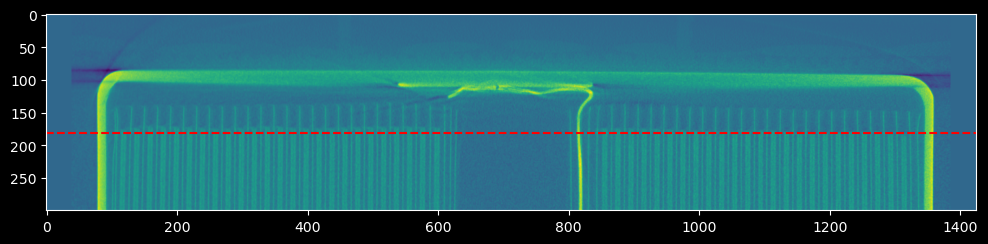

In [244]:
z_min = 181
vol = global_data.vol
axial = vol[:, :, vol.shape[2] // 2]

plt.figure(figsize=(12, 8))
plt.imshow(axial[:300])
plt.axhline(y=z_min, color="r", linestyle="--")

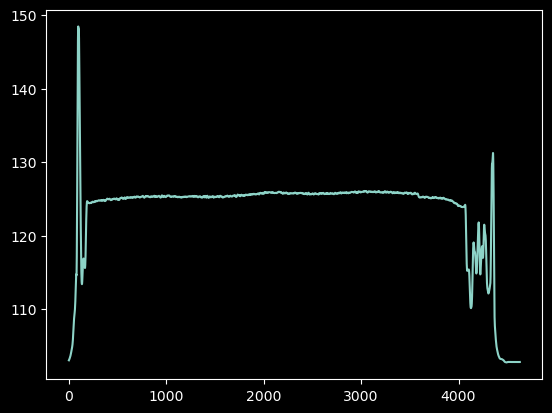

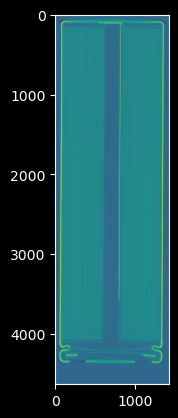

In [307]:
profile = axial.mean(axis=1)
profile = profile[:]
profile = savgol_filter(profile, window_length=21, polyorder=2)
deriv = savgol_filter(profile, window_length=21, polyorder=3, deriv=1)
deriv = np.clip(deriv, 0, None)
pks, pinfo = scipy.signal.find_peaks(deriv, height=1/70, distance=10)
#print(pks)
#print(pinfo)
plt.plot(profile[:])
plt.show()
plt.imshow(axial)
for p in pks:
    pass#plt.axvline(x=p, color="r", linestyle="--")



In [206]:
df.columns

Index(['n_voxels', 'n_seed', 'z_min', 'z_max', 'z_extent', 'y_extent',
       'x_extent', 'fill', 'centroid_z', 'centroid_y', 'centroid_x',
       'snr_cluster', 'r_peak', 'r_peak_ratio', 'peak_offset', 'snr_peak',
       'linearity', 'planarity', 'sphericity', 'axis_z', 'normal_z',
       'edge_contrast', 'decay_drop', 'seed_grown_ratio'],
      dtype='object')

## Grayscale landarks

In [ ]:
grayscale_landmarks = global_data.grayscale_landmarks
air_grayvalue = grayscale_landmarks["air_grayvalue"]
core_grayvalue = grayscale_landmarks["core_grayvalue"]
metal_threshold = grayscale_landmarks["metal_threshold"]
max_grayvalue = grayscale_landmarks["max_grayvalue"]
print(
    f"Air: {air_grayvalue}, Core: {core_grayvalue}, Metal threshold: {metal_threshold}, Max: {max_grayvalue}"
)

# Grab an axial slice
axial_ref_section = global_data.vol[:, :, global_data.vol.shape[1] // 2]

Right Peak: 136, Other Peaks: [193], Prominences: [26422.30788286]
Air: 98, Core: 102, Metal threshold: 164, Max: 233


## Offset to bottom of cell

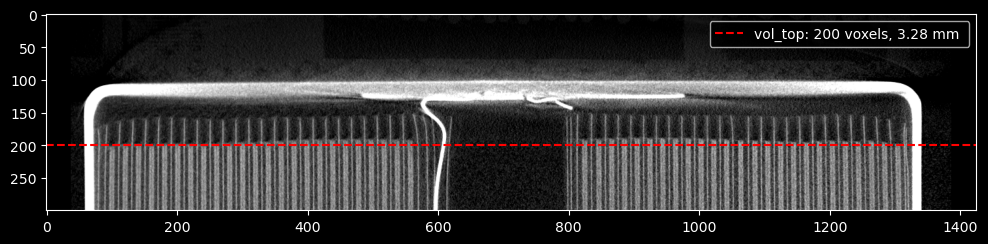

In [147]:
plt.figure(figsize=(12, 12))
plt.imshow(
    axial_ref_section[:300],
    cmap="gray",
    vmin=air_grayvalue,
    vmax=metal_threshold,
)
top = 200
plt.axhline(
    y=top,
    color="r",
    linestyle="--",
    label=f"vol_top: {top} voxels, {top * global_data.voxel_size_mm:.2f} mm ",
)
plt.legend()

## Extract data columns as np arrays

In [112]:
n_voxels = df["n_voxels"].to_numpy()
n_seeds = df["n_seed"].to_numpy()
z_extents = df["z_extent"].to_numpy()
y_extents = df["y_extent"].to_numpy()
x_extents = df["x_extent"].to_numpy()
centroid_z = df["centroid_z"].to_numpy()
centroid_y = df["centroid_y"].to_numpy()
centroid_x = df["centroid_x"].to_numpy()
snr_cluster = df["snr_cluster"].to_numpy()
peak_offset = df["peak_offset"].to_numpy()
r_peak = df["r_peak"].to_numpy()
r_peak_ratio = df["r_peak_ratio"].to_numpy()
snr_peak = df["snr_peak"].to_numpy()
linearity = df["linearity"].to_numpy()
planarity = df["planarity"].to_numpy()
sphericity = df["sphericity"].to_numpy()
axis_z = df["axis_z"].to_numpy()
normal_z = df["normal_z"].to_numpy()
edge_contrast = df["edge_contrast"].to_numpy()
decay_drop = df["decay_drop"].to_numpy()
seed_grown_ratio = df["seed_grown_ratio"].to_numpy()

k = k_low
mu, std = truncated_normal_moments(k)
snr_cluster_corrected = (
    (snr_cluster * np.sqrt(n_voxels) - n_voxels * mu) / np.sqrt(n_voxels) / std
)


Total number of particles detected: 1393
Max particle volume (voxels): 43


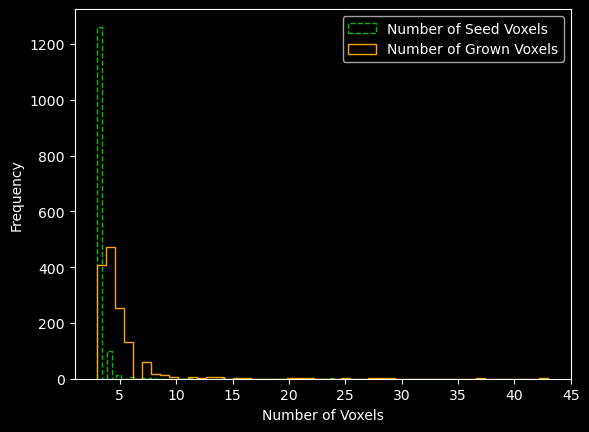

In [115]:
print(f"Total number of particles detected: {len(n_voxels)}")
print(f"Max particle volume (voxels): {np.max(n_voxels)}")
_ = plt.hist(
    n_seeds,
    bins=50,
    alpha=0.75,
    label="Number of Seed Voxels",
    cumulative=False,
    density=False,
    histtype="step",
    color="Lime",
    linestyle="dashed",
)
if True:
    _ = plt.hist(
        n_voxels,
        bins=50,
        alpha=1.0,
        label="Number of Grown Voxels",
        cumulative=False,  # True,
        density=False,  # True,
        histtype="step",
        color="orange",
    )

plt.xlabel("Number of Voxels")
plt.ylabel("Frequency")
plt.legend()


/var/folders/29/803dzgr92dx7_lk8zb5y_j7r0000gn/T/ipykernel_64225/2347473729.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Text(0.5, 1.0, 'Number of grown seeds vs number of seed voxels')

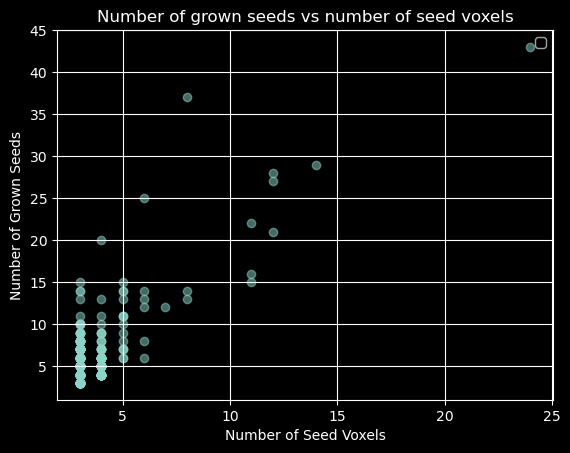

In [116]:
plt.scatter(
    n_seeds,
    n_voxels,
    alpha=0.5,
    # label="Number of Seeds",
)
plt.xlabel("Number of Seed Voxels")
plt.ylabel("Number of Grown Seeds")
plt.grid(True)
plt.legend()
plt.title("Number of grown seeds vs number of seed voxels")

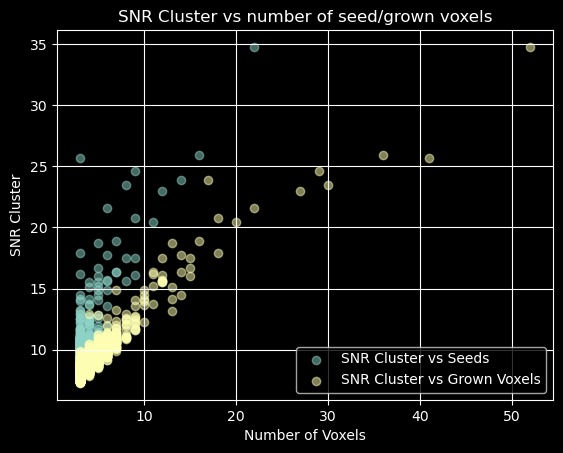

In [53]:
# SNR cluster is sum of SNR of all voxels in the cluster divided by sqrt of number of voxels in the cluster
plt.scatter(
    n_seeds,
    snr_cluster,
    alpha=0.5,
    label="SNR Cluster vs Seeds",
)
plt.scatter(
    n_voxels,
    snr_cluster,
    alpha=0.5,
    label="SNR Cluster vs Grown Voxels",
)
plt.xlabel("Number of Voxels")
plt.ylabel("SNR Cluster")
plt.grid(True)
plt.title("SNR Cluster vs number of seed/grown voxels")
plt.legend()

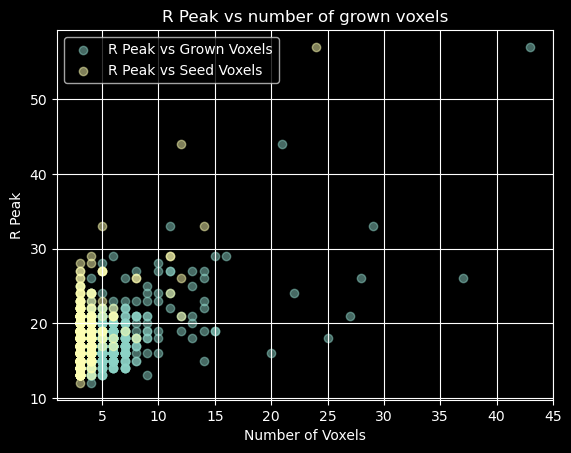

In [117]:
plt.scatter(
    n_voxels,
    r_peak,
    alpha=0.5,
    label="R Peak vs Grown Voxels",
)
plt.scatter(
    n_seeds,
    r_peak,
    alpha=0.5,
    label="R Peak vs Seed Voxels",
)
plt.xlabel("Number of Voxels")
plt.ylabel("R Peak")
plt.grid(True)
plt.title("R Peak vs number of grown voxels")
plt.legend()

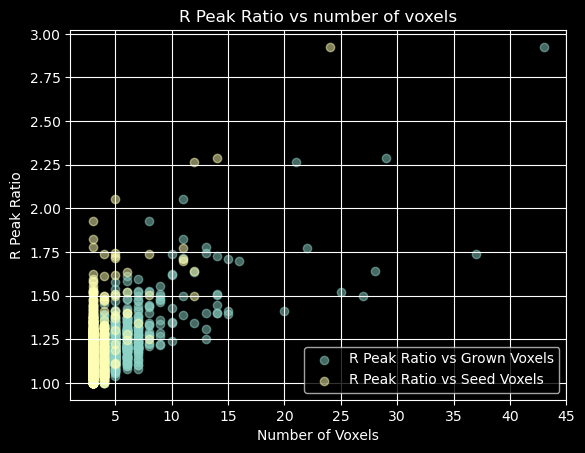

In [118]:
plt.scatter(
    n_voxels,
    r_peak_ratio,
    alpha=0.5,
    label="R Peak Ratio vs Grown Voxels",
)
plt.scatter(
    n_seeds,
    r_peak_ratio,
    alpha=0.5,
    label="R Peak Ratio vs Seed Voxels",
)
plt.xlabel("Number of Voxels")
plt.ylabel("R Peak Ratio")
plt.grid(True)
plt.title("R Peak Ratio vs number of voxels")
plt.legend()

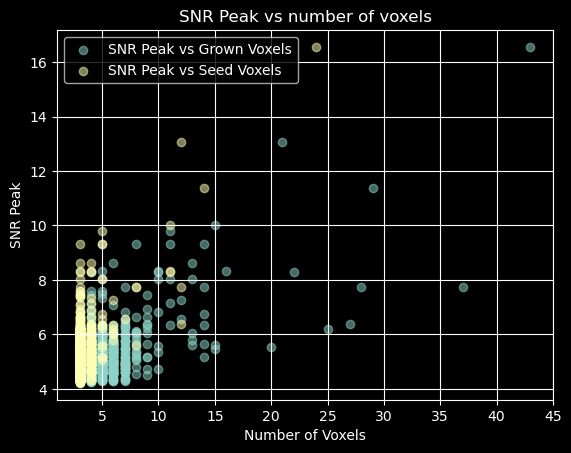

In [119]:
plt.scatter(
    n_voxels,
    snr_peak,
    alpha=0.5,
    label="SNR Peak vs Grown Voxels",
)
plt.scatter(
    n_seeds,
    snr_peak,
    alpha=0.5,
    label="SNR Peak vs Seed Voxels",
)
plt.xlabel("Number of Voxels")
plt.ylabel("SNR Peak")
plt.grid(True)
plt.title("SNR Peak vs number of voxels")
plt.legend()

Text(0.5, 1.0, 'Axis Z vs number of voxels')

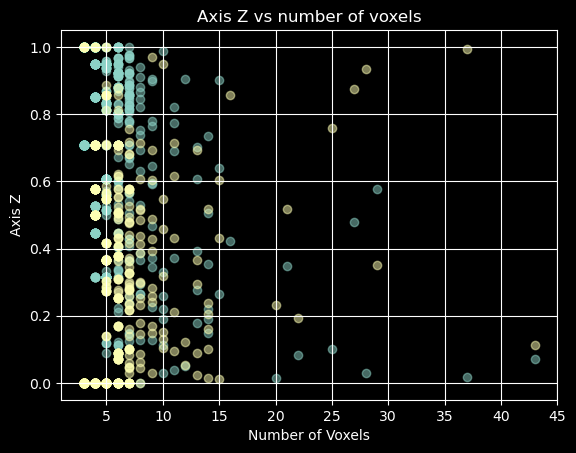

In [120]:
plt.scatter(
    n_voxels,
    axis_z,
    alpha=0.5,
    label="Axis Z vs Grown Voxels",
)
plt.scatter(
    n_voxels,
    normal_z,
    alpha=0.5,
    label="Normal Z vs Grown Voxels",
)

plt.xlabel("Number of Voxels")
plt.ylabel("Axis Z")
plt.grid(True)
plt.title("Axis Z vs number of voxels")
# plt.legend()

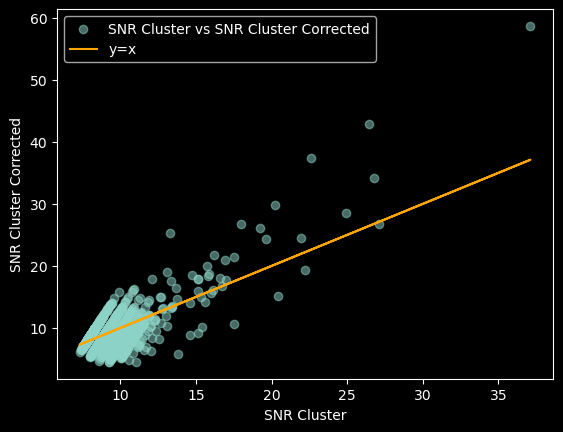

In [121]:
plt.scatter(
    snr_cluster,
    snr_cluster_corrected,
    alpha=0.5,
    label="SNR Cluster vs SNR Cluster Corrected",
)
plt.plot(snr_cluster, snr_cluster, color="orange", label="y=x")
plt.xlabel("SNR Cluster")
plt.ylabel("SNR Cluster Corrected")
plt.legend()
plt.show()

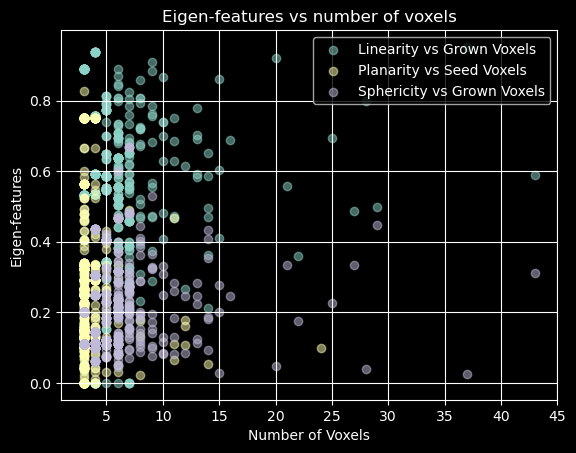

In [122]:
plt.scatter(
    n_voxels,
    linearity,
    alpha=0.5,
    label="Linearity vs Grown Voxels",
)
plt.scatter(
    n_seeds,
    planarity,
    alpha=0.5,
    label="Planarity vs Seed Voxels",
)
plt.scatter(
    n_voxels,
    sphericity,
    alpha=0.5,
    label="Sphericity vs Grown Voxels",
)
plt.xlabel("Number of Voxels")
plt.ylabel("Eigen-features")
plt.grid(True)
plt.title("Eigen-features vs number of voxels")
plt.legend()

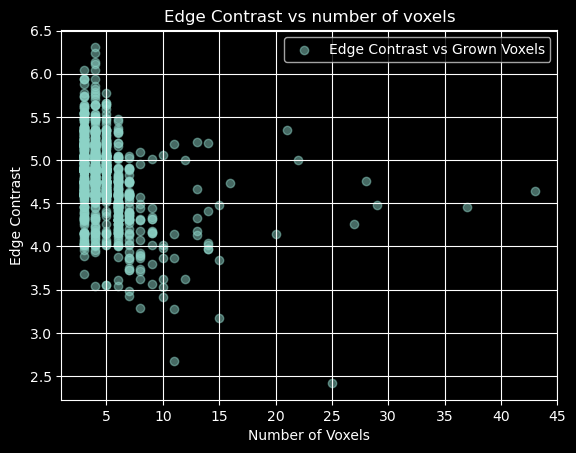

In [124]:
plt.scatter(n_voxels, edge_contrast, alpha=0.5, label="Edge Contrast vs Grown Voxels")
plt.xlabel("Number of Voxels")
plt.ylabel("Edge Contrast")
plt.grid(True)
plt.title("Edge Contrast vs number of voxels")
plt.legend()

-0.4461 2.8851


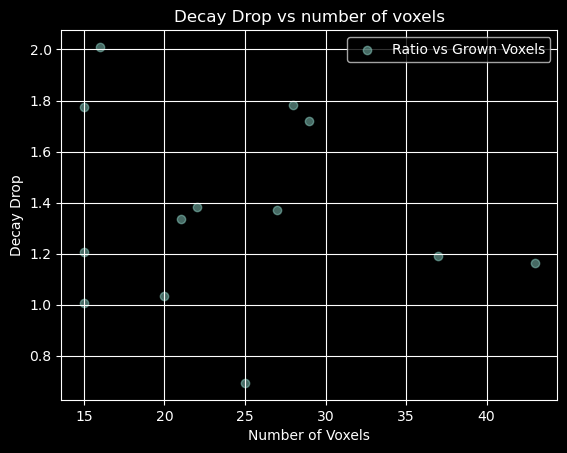

In [125]:
mask = n_voxels >= 15
print(decay_drop.min(), decay_drop.max())
plt.scatter(
    n_voxels[mask],
    decay_drop[mask],
    alpha=0.5,
    label="Ratio vs Grown Voxels",
)
plt.xlabel("Number of Voxels")
plt.ylabel("Decay Drop")
plt.grid(True)
plt.title("Decay Drop vs number of voxels")
plt.legend()

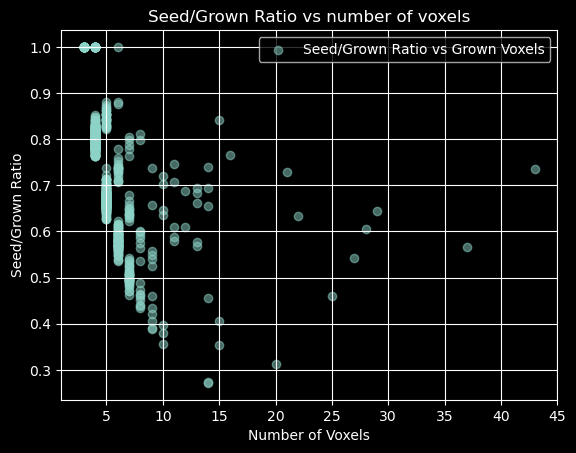

In [126]:
plt.scatter(
    n_voxels,
    seed_grown_ratio,
    alpha=0.5,
    label="Seed/Grown Ratio vs Grown Voxels",
)
plt.xlabel("Number of Voxels")
plt.ylabel("Seed/Grown Ratio")
plt.grid(True)
plt.title("Seed/Grown Ratio vs number of voxels")
plt.legend()

# Search for identified particles

**Notes**
- The cells loaded here are upside down, so we need to take that into account because the reports are from the bottom

**Cell Info**
- Cell 1

- Cell 7 - located near slice at 32mm (~1951voxels)
- cell 14 - located near slice at 19mm (~1158)
  - ID particle at 2441 (40.0mm) at x,y=771,391
  - ID particle at 2797 (45.9)
  - Particle at 3579 is a FP off the core metal tab.
- cell 15 - located near slice at 61mm (~3710voxels)
  - ID parrticle at 3874 (63.7mm) at (x,y) = (468,135) - near can wall

centroid_z: [1852.513 1887.975 1911.451 1993.784 2022.596 2133.519 2182.752 3031.507
 3086.315],
centroid_y: [ 509.026  590.02  1197.587  441.418  459.809 1009.961  712.881  870.
  799.37 ],
centroid_x: [1010.231  269.025  416.613  864.042  290.319  624.093 1234.604 1110.284
  181.842]
Slice locations from bottom (mm): [30.45531372 31.038309   31.42425444 32.77780896 33.25147824 35.07505236
 35.88444288 49.83797508 50.7390186 ],
Slice locations from bottom (voxels): [1852.513 1887.975 1911.451 1993.784 2022.596 2133.519 2182.752 3031.507
 3086.315]
Number of candidates at the threshold: 9,
Number of grown voxels at the threshold: [13 13 43 14 10 10 15 10 14],
SNR cluster at the threshold: [15.5928 15.9761 37.1143 16.7165 13.1151 12.0487 15.4225 12.5776 14.6185]


Text(0.5, 1.0, 'Centroid Z vs number of voxels')

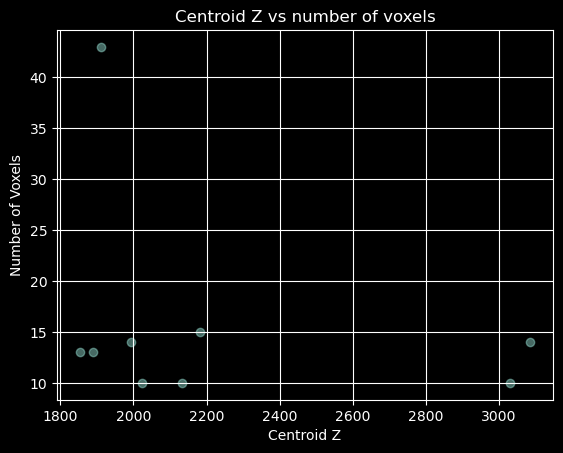

In [ ]:
_mask = (n_voxels > 9) & (centroid_z > 1793) & (centroid_z < 3329)

print(
    f"centroid_z: {centroid_z[_mask]},\ncentroid_y: {centroid_y[_mask]},\ncentroid_x: {centroid_x[_mask]}"
)
print(
    f"Slice locations from bottom (mm): {centroid_z[_mask] * 0.01644},\nSlice locations from bottom (voxels): {centroid_z[_mask]}"
)
print(
    f"Number of candidates at the threshold: {len(n_voxels[_mask])},\nNumber of grown voxels at the threshold: {n_voxels[_mask]},\nSNR cluster at the threshold: {snr_cluster[_mask]}"
)

plt.scatter(
    centroid_z[_mask],
    n_voxels[_mask],
    alpha=0.5,
    label="Centroid Z vs Grown Voxels",
)
plt.xlabel("Centroid Z")
plt.ylabel("Number of Voxels")
plt.grid(True)
plt.title("Centroid Z vs number of voxels")

Volume shape: 4630 x 1425 x 1425


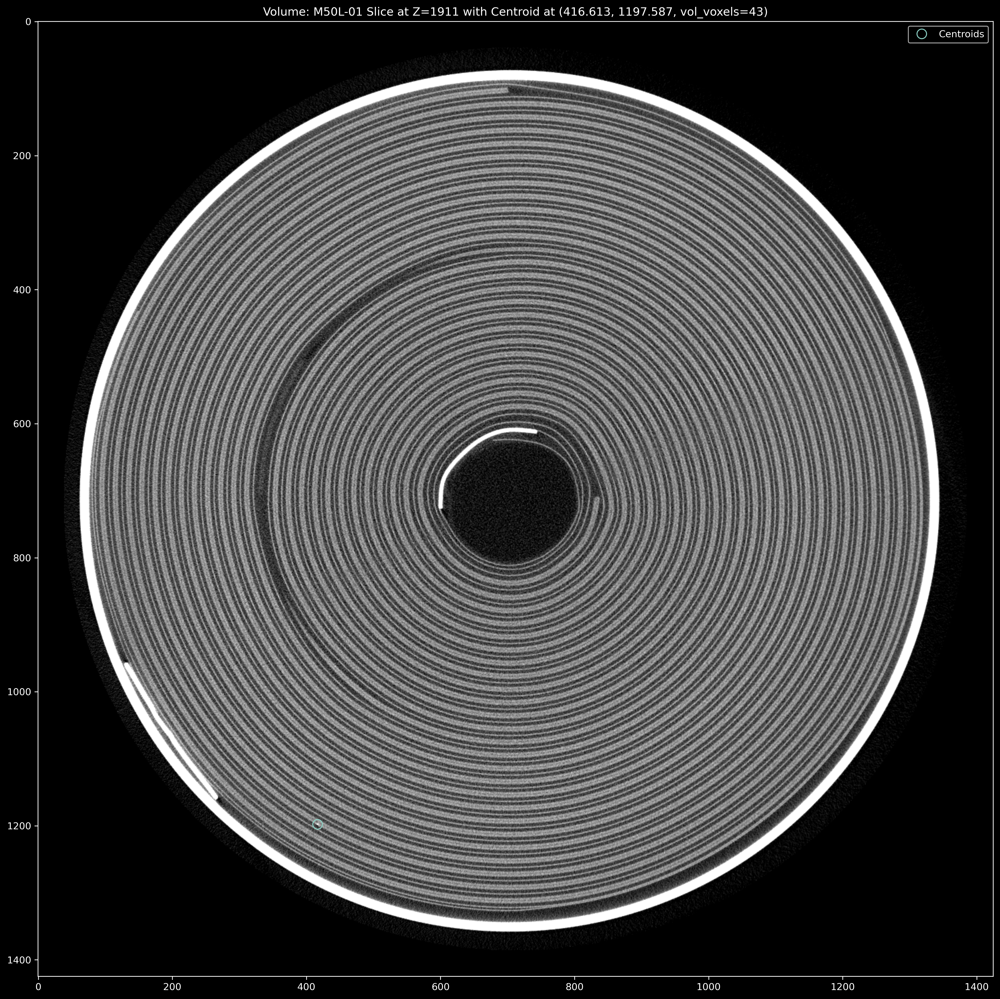

In [135]:
vol = global_data.vol
min_ = global_data.grayscale_landmarks["air_grayvalue"]
max_ = global_data.grayscale_landmarks["metal_threshold"]
z_, h_, w_ = vol.shape
print(f"Volume shape: {z_} x {h_} x {w_}")
idx = 2
offset = 0
vol_voxels = n_voxels[_mask][idx]
z_slice = centroid_z[_mask][idx].astype(int) + offset
slice_ = vol[z_slice, :, :].astype(np.float32)
slice_ = (slice_ - min_) / (max_ - min_) * 255.0
slice_ = np.clip(slice_, 0, 255).astype(np.uint8)
plt.figure(figsize=(18, 18), dpi=300)
plt.imshow(slice_, cmap="gray", vmin=0, vmax=255)
plt.title(
    f"Volume: {global_data.vol_data_path.stem} "
    f"Slice at Z={z_slice} with Centroid at ({centroid_x[_mask][idx]}, {centroid_y[_mask][idx]}, vol_voxels={n_voxels[_mask][idx]})"
)
plt.plot(
    centroid_x[_mask][idx],
    centroid_y[_mask][idx],
    "o",
    markersize=10,
    fillstyle="none",
    label="Centroids",
)
plt.legend()

# End of Analysis

In [ ]:
sorted_dr_idx = np.argsort(decay_drop)
decay_drop[sorted_dr_idx[-1]]

In [ ]:
idx = 2
(
    n_seeds[sorted_dr_idx[idx]],
    n_voxels[sorted_dr_idx[idx]],
    decay_drop[sorted_dr_idx[idx]],
)

## Identify the snr_peak and seed_grown ratio for the 3 highest decay_drop above 20 voxel volumes

In [ ]:
voxels_mask = n_voxels >= 20
masked_voxels = n_voxels[voxels_mask]
masked_snr = snr_cluster[voxels_mask]
masked_seed_grown_ratio = seed_grown_ratio[voxels_mask]
masked_decay_drop = decay_drop[voxels_mask]
masked_seeds = n_seeds[voxels_mask]
masked_linearity = linearity[voxels_mask]
masked_planarity = planarity[voxels_mask]
masked_sphericity = sphericity[voxels_mask]
masked_edge_contrast = edge_contrast[voxels_mask]
masked_peak_offset = peak_offset[voxels_mask]
masked_z_axis = axis_z[voxels_mask]
masked_z_normal = normal_z[voxels_mask]

sorted_idxs = np.argsort(masked_decay_drop)[::-1]

# print(len(masked_snr), masked_snr.min(), masked_snr.max())

In [ ]:
(
    masked_decay_drop[sorted_idxs[0]],
    masked_decay_drop[sorted_idxs[1]],
    masked_decay_drop[sorted_idxs[2]],
)
masked_snr[sorted_idxs[0]], masked_snr[sorted_idxs[1]], masked_snr[sorted_idxs[2]]
(
    masked_seed_grown_ratio[sorted_idxs[0]],
    masked_seed_grown_ratio[sorted_idxs[1]],
    masked_seed_grown_ratio[sorted_idxs[2]],
)
masked_seeds[sorted_idxs[0:3]]
masked_voxels[sorted_idxs[0:3]]
masked_linearity[sorted_idxs[0:3]]
masked_planarity[sorted_idxs[0:3]]
masked_sphericity[sorted_idxs[0:3]]
masked_peak_offset[sorted_idxs[0:3]]
masked_z_axis[sorted_idxs[0:3]]
masked_z_normal[sorted_idxs[0:3]]

In [ ]:
61 / 0.0164


3719.5121951219508